### C1C James Baggett
### C1C Bryson Fraelich
### C1C Weston Corbeil
### Documentation Statement
We used the given YOLOv5 lab that was provided during class for the entire Task 2. We also followed along with the roboflow YOLOv5 video that showed how to run the project (https://www.youtube.com/watch?v=MdF6x6ZmLAY&t=1522s&ab_channel=Roboflow). 

We used Geeksforgeeks for python syntax.

Used the colabs given camera capture code.

#PEX 5 YOLO!
## 80 Points

In PEX 5 you will train the YOLO object detection algorihtm to detect objects that interest you. If you are not feeling creative, you can collect data and train a model to detect playing card suits and face values. You will then do something interesting with your model. For example, with the playing card data set, you can use the web cam to play blackjack without user input. 

The graded objectives for PEX 5 are:

(10 pts) Collect and label data for use in building a custom YOLO model

(20 pts) Train the YOLO model to high accuracy for your domain

  **"Lt Col Maher, what is high accuracy?" ... It depends on your domain. If you want to make sure you recieve full credit, write down all of your efforts to improve the accuracy of the model, and write a statement why you think you have achieved peak accuracy in this model. Charts and graphs will help to justify your stance. 

(10 pts) Use data analysis to interpret the Mean Average Precision, accuracy and recall of your model

(20 pts) Enable object detection through a web camera

(20 pts) Write code that does something interesting with your model. 

(10 pts) Write a 300-500 word essay describing the possible ethical implications of your project. Reference an ethical framework to justify your view. 


**AUTHORIZED RESOURCES:** Any material from the CS 471 course site and online resources. You may reuse online code as long as you describe what the code is doing in your comments and you modify it to solve this problem. Don't forget to document any online code sources. 

**NOTE:**

*  Never copy another person’s or group’s work and submit it as your own.
*  Do not jointly create a program or complete this assignment unless explicitly allowed.
*   You must document all help received from sources other than your instructor or instructor-provided course materials (including your textbook).

**Documentation Policy:**

*   You must document all help received from any source other than your instructor or instructor-provided materials, including your textbook (unless directly quoting or paraphrasing).
*   The documentation statement must explicitly describe WHAT assistance was provided, WHERE on the assignment the assistance was provided, and WHO provided the assistance, and HOW it was used in completing the assignment.
*   If no help was received on this assignment, the documentation statement must state “None.”
*   If you checked answers with anyone, you must document with whom on which problems. You must document whether or not you made any changes, and if you did make changes you must document the problems you changed and the reasons why.
*   Vague documentation statements must be corrected before the assignment will be graded and will result in a 5% deduction on the assignment.

**Turn-in Policies:**

*   On-time turn-in is at the specific day and time listed above.
*   Post the required solution files to your Github Classroom repo.
*   Only 1 turn-in required per team.






## (10 pts) Task 1 Train and Label data for use in building a custom YOLO model. 
I recommend creating an account with Roboflow.com to upload pictures and label the data set. There are several other tools available that you are welcome to use. If you use another tool, I will need a way to access your data; please provide that method in the text box below. If you use Roboflow, copy and paste the link to your Roboflow project page below.

https://app.roboflow.com/james-baggett/cards-mja7g/4

## (20 pts) Task 2 Train a Yolo model to high accuracy. 

Keep a log of your experimentation with improving your model. 

## Setup

In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 10152, done.
remote: Total 10152 (delta 0), reused 0 (delta 0), pack-reused 10152
Receiving objects: 100% (10152/10152), 10.45 MiB | 20.23 MiB/s, done.
Resolving deltas: 100% (7035/7035), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [2]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 7.7 MB/s 
Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


In [3]:
# Grab our roboflow project
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="FU0f5kKIGIgmdcQP6tHM")
project = rf.workspace().project("cards-mja7g")
dataset = project.version(8).download("yolov5")

     |████████████████████████████████| 145 kB 8.4 MB/s 
     |████████████████████████████████| 178 kB 39.3 MB/s 
     |████████████████████████████████| 1.1 MB 36.4 MB/s 
     |████████████████████████████████| 67 kB 5.8 MB/s 
     |████████████████████████████████| 138 kB 50.4 MB/s 
     |████████████████████████████████| 62 kB 849 kB/s 
  Created wheel for roboflow: filename=roboflow-0.2.1-py3-none-any.whl size=20914 sha256=1f6d1d39e58a8a53318d2cc906b646b35db7b6650369b7c6c9ca08b334efed79
  Stored in directory: /root/.cache/pip/wheels/57/00/03/2d83f3e90ff41c36eef9c3747c328290c01b06e2619f9ed7b6
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=de001c99b99d927b70d85488a3363c28ff717c18c8d8705529b70e8322570797
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built roboflow wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Cards-8 in yolov5pytorch:: 100%|██████████| 286/286 [00:00<00:00, 3458.93it/s]


In [4]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat /content/yolov5/Cards-8/data.yaml
dataset.location = '/content/yolov5/Cards-8'

names:
- 10_c
- 10_d
- 10_h
- 10_s
- 2_c
- 2_d
- 2_h
- 2_s
- 3_c
- 3_d
- 3_h
- 3_s
- 4_c
- 4_d
- 4_h
- 4_s
- 5_c
- 5_d
- 5_h
- 5_s
- 6_c
- 6_d
- 6_h
- 6_s
- 7_c
- 7_d
- 7_h
- 7_s
- 8_c
- 8_d
- 8_h
- 8_s
- 9_c
- 9_d
- 9_h
- 9_s
- A_c
- A_d
- A_h
- A_s
- J_c
- J_d
- J_h
- J_s
- K_c
- K_d
- K_h
- K_s
- Q_c
- Q_d
- Q_h
- Q_s
nc: 52
train: Cards-8/train/images
val: Cards-8/valid/images


In [5]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [6]:
#this is the model configuration we will use
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

## Use the below if we want to adjust the custom_yolov5s.yaml

In [7]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [8]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## Google Drive

In [9]:
## Here we import our google drive to save the results of each run
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## Training

We change the name of the weights to the last best weights, and the name of the new results file each time.

In [19]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 1000 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights 'runs/train/yolov5s_results4/weights/best.pt' --name yolov5s_results5  --cache --exist-ok

Streaming output truncated to the last 5000 lines.
     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     1/999     1.61G   0.01731    0.0105   0.00667   0.03448        17       416: 100% 7/7 [00:01<00:00,  5.99it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 1/1 [00:00<00:00,  5.37it/s]
                 all          23          46       0.515       0.766       0.757       0.427

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     2/999     1.61G    0.0166  0.009748  0.007475   0.03382        15       416: 100% 7/7 [00:01<00:00,  6.22it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 1/1 [00:00<00:00,  6.01it/s]
                 all          23          46       0.702       0.655       0.749       0.426

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     3/999     1.61G   0.01735

In [20]:
%cp -r /content/yolov5/runs/train/yolov5s_results5 /content/gdrive/MyDrive/Final_data

## (20 pts) Task 3 Justify how well your model performs
Provide charts showing at least the Mean Average Precision, Accuracy, and Recall of your model. Discuss the charts and what these results mean. You may want to include a discussion on overfitting and underfitting in your discussion. 

In [21]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

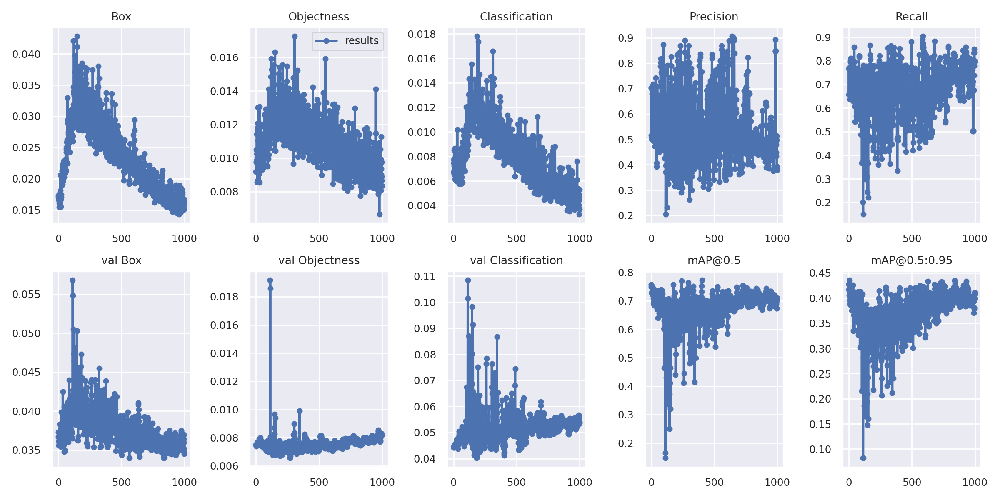

In [22]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results5/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


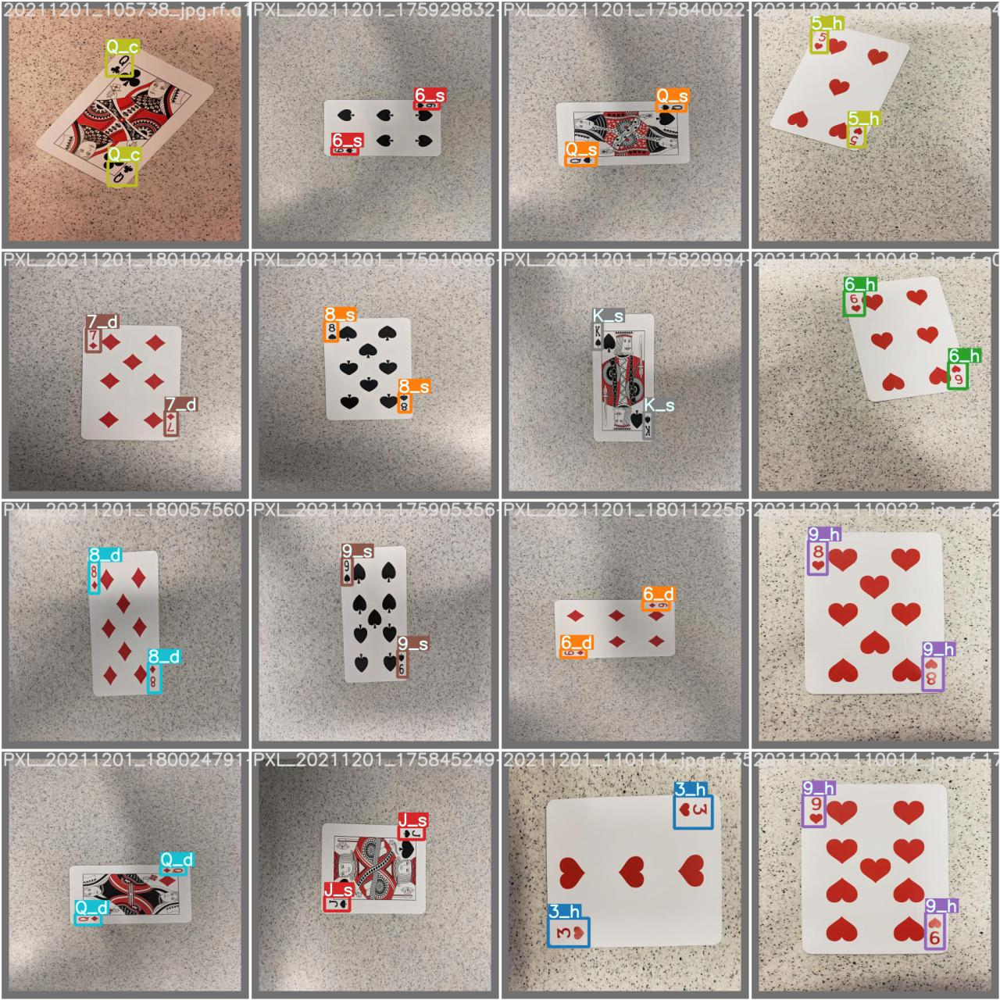

In [23]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results5/test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


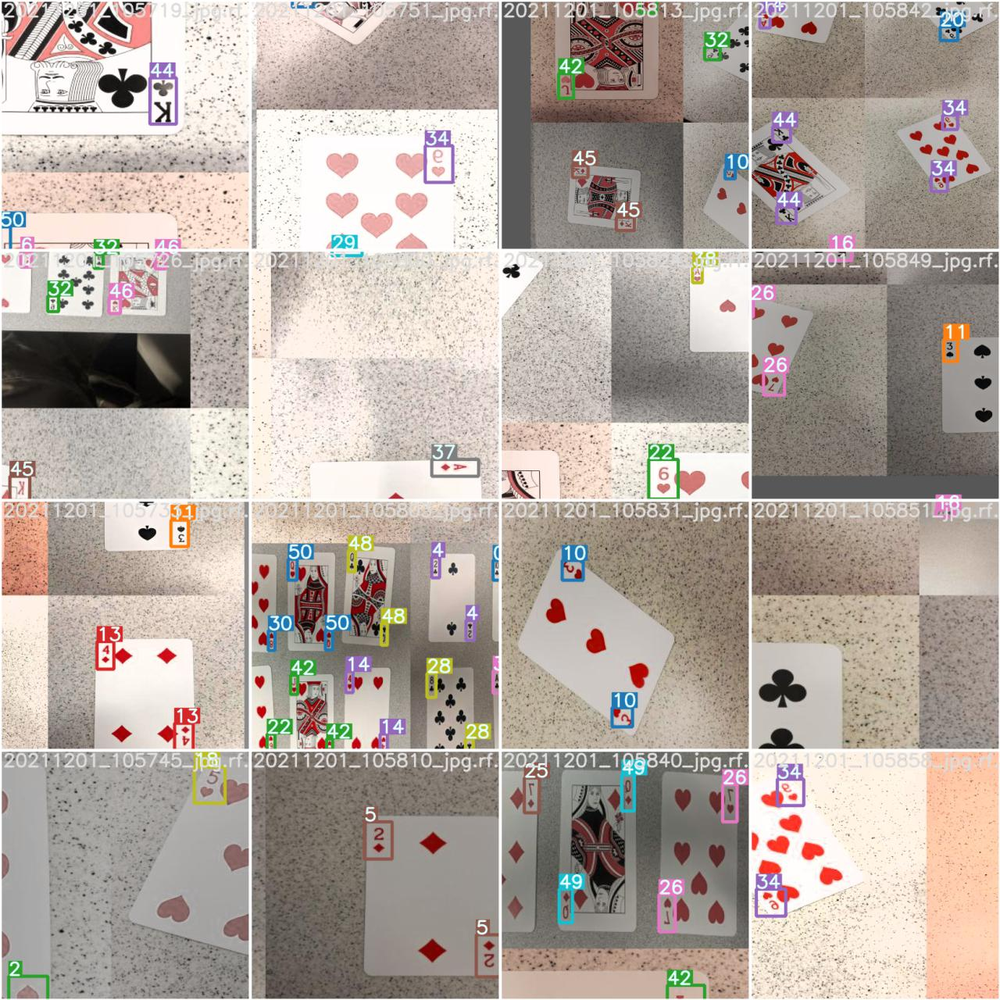

In [24]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results5/train_batch0.jpg', width=900)

In [26]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results5/weights/best.pt --img 416 --conf 0.2 --source Cards-8/test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.2, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='Cards-8/test/images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results5/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7384065 parameters, 0 gradients, 17.2 GFLOPS
image 1/15 /content/yolov5/Cards-8/test/images/20211201_105821_jpg.rf.c54e52605d5435b110848494d28d5061.jpg: 416x416 1 8_c, 1 9_c, Done. (0.017s)
image 2/15 /cont

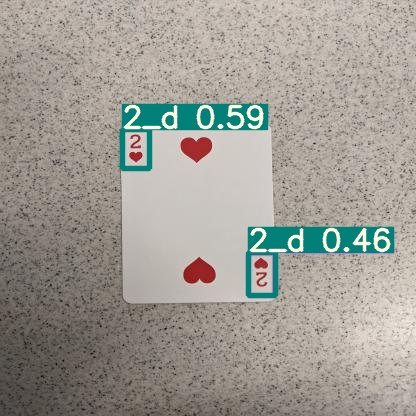

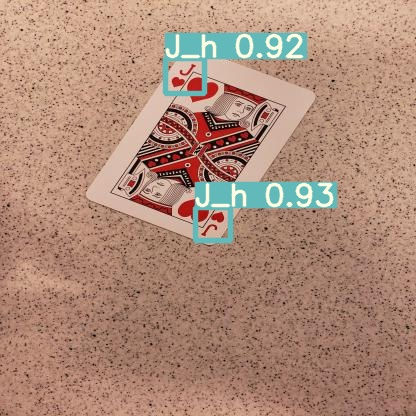

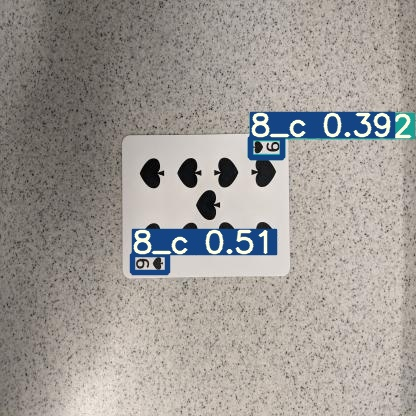

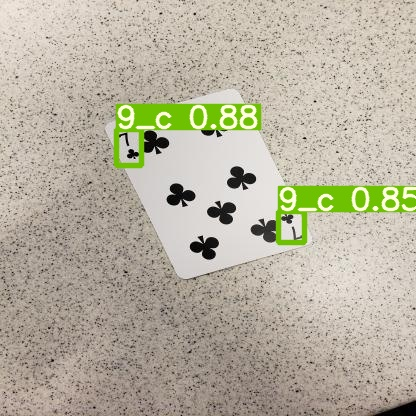

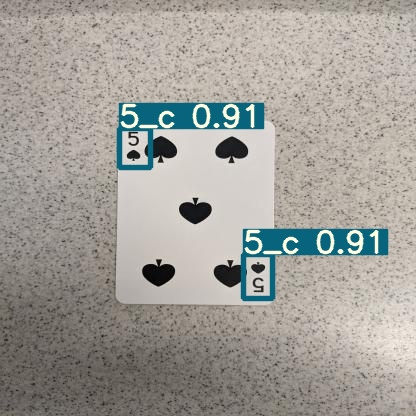

...

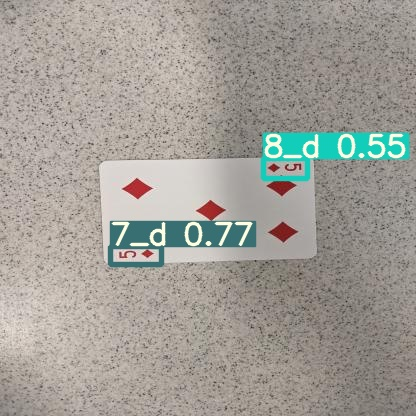

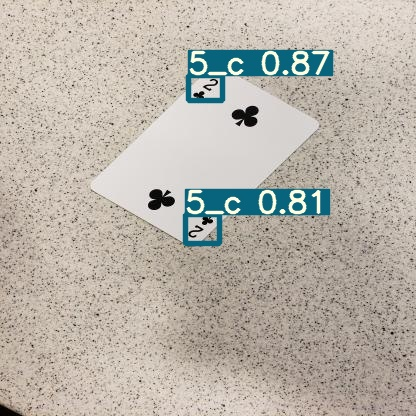

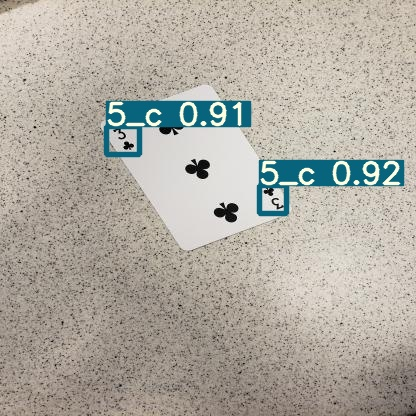

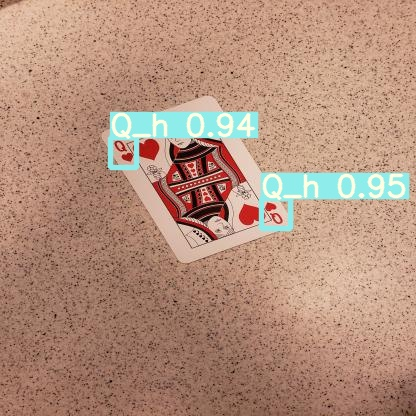

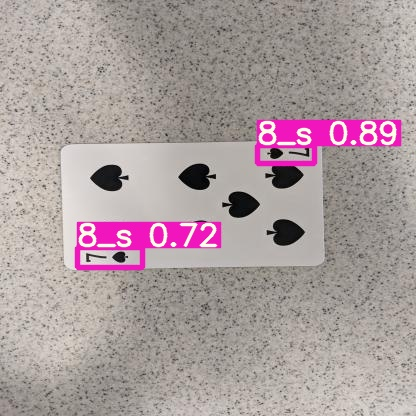

In [27]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

##(20 pts) Task 4. Connect your model to Webcam streaming

Enable your model to predict in real-time on a web camera, using your custom model. If the objects you train your model to are not something commonly available, please provide the web cam code and a pre-recorded video of you detecting the object. 

Hint: On the left hand side, Google Colab gives you code for accessing your webcam with Javascript. Use this code to get your webcam working. YOLO has a webcam input functionality built-in, but you cannot use this functionality, because it is attempting to open the webcam on Google's server and not your laptop. To execute this step

1.   Modify the webcam code so that it will open the webcam,
2.   take a picture,
1.   close the webcam,
2.   run the detection algorithm,
1.   display the detection image
2.   and then repeat 5 times.

This will not be the same as real-time webcam footage, but it will get you as close as you can get on Google Colab. 


Have to change the name of the photo every time.

In [81]:
##Answer to Task 4. Paste your code here. You may use code from the internet and in-class exercises 
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo4.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

Saved to photo4.jpg


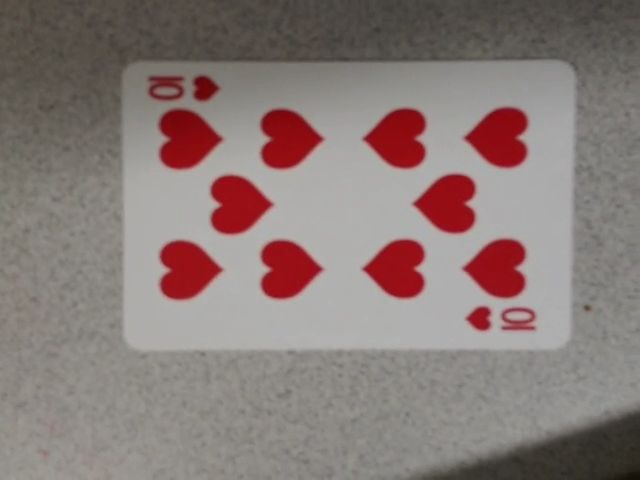

In [82]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

Need to update the photo for the source

In [86]:
%cd /content/yolov5/
filenamex = open("test.txt", "a")
temp = !python detect.py --weights 'runs/train/yolov5s_results5/weights/best.pt' --img 416 --conf 0.2 --source '/content/yolov5/photo4.jpg'
filenamex.write(str(temp))

/content/yolov5


969

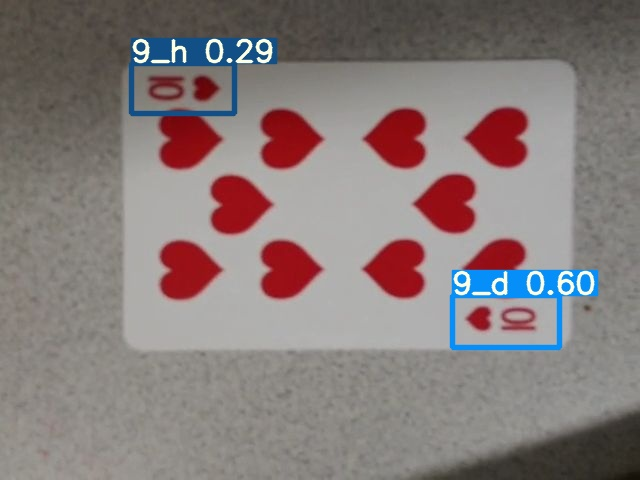

In [87]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp28/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [36]:
%cp -r /content/yolov5 /content/gdrive/MyDrive

##(10 pts) Task 5. Create something interesting using your model

You have a limited time, so don't make this a huge feature, just something cool your model could do. For example, something that counts the objects coming across the webcam would receive full points. If you have a more creative idea, I may be inclined to add some bonus points, but make sure you are taking care of your other classwork as well. 

In [88]:
Filename = open('test.txt', 'r')
prediction = Filename.readline()
newprediction = prediction.split("320x416")
i = 1;

Face_counter = 0
Num_counter = 0
while i<len(newprediction):
    data_p = newprediction[i]
    data_piece = data_p[3]
    if (data_piece == 'J' or data_piece == 'Q' or data_piece == 'K' or data_piece == 'A'):
        Face_counter += 1
    else:
        Num_counter += 1
    i+=1;
print("Face cards: " + str(Face_counter))
print("Number cards: " + str(Num_counter))



Face cards: 3
Number cards: 2


### (10 pts) Task 6. Write 300-500 words on the ethical implications of your project.
Make sure you support your thoughts with ethical frameworks from ACM, IEEE, or any other reputible source. 

##Answer to Task 6
  While I don't believe this project in particular represents any high risk ethical implications there are a few we need to consider. I think the biggest risk for creating this project is respecting the privacy of others. As one of the core principles within the ACM code of ethics, respecting people's privacy when creating any project is very important. The thought that comes to my mind in this case is ensuring there is no information or people depicted in the photos we use to train the model that would go against their consent or knowledge. While working with YOLO in particular loading 100s or even 1000s of images into a dataset immediately raises some privacy concerns. Making sure you have consent and the rights to use all the images in your dataset is very important. Although this is less so with the topic of playing cards, I think if you were to apply YOLO to something else such as person identification this principle would become a much greater topic of discussion. I think another ethical implication that comes with this project falls under the principle of Respect the work required to produce new ideas, inventions, creative works, and computing artifacts. We have to realize that most of the code we are using is borrowed and that we cannot claim private ownership for its development. Additionally, we have to be cognizant of which resources we are allowed to use for this project. As stated in the resource statement we were allowed to use course materials as well as online code as long as we explain what it is doing and document its use. Documenting resources used expands beyond the honor system here at USAFA and being able to recognize the importance of giving credit for other people's work is good ethical practice. It is important to think about these kinds of implications when regarding any project no matter how small or low-risk it might seem.